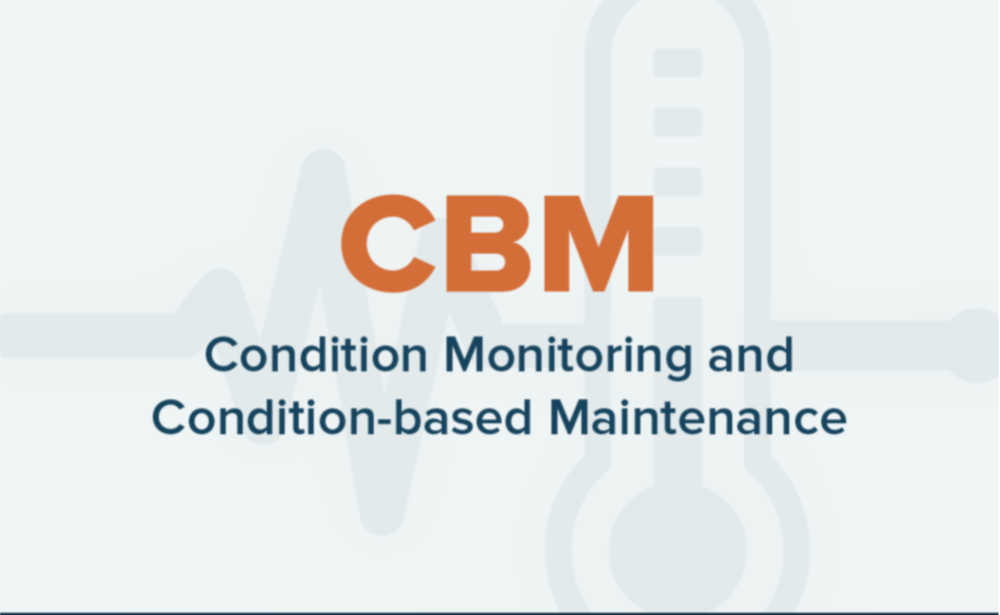

## Problem Statement
This dataset records operational performance metrics of a ship's gas turbine propulsion system. Each row represents a set of measurements taken under specific conditions, likely at different times or operational states. The parameters captured include various torque measurements, rates of revolutions, temperatures, pressures, fuel flow, and state coefficients. These metrics are crucial for monitoring and analyzing the propulsion system's performance, efficiency, and maintenance needs.
The data can be used for predictive maintenance, performance optimization, and anomaly detection. By analyzing the relationship between these parameters, one can identify patterns that indicate potential issues or areas for improvement in the propulsion system.


## Data Description
- Lever position(measure in RPM-Low to High): Position of the ship's lever (range: 1.138 to 9.3).(Indicates throttle speed
- Ship speed (v): Speed of the ship, likely in knots (range: 3 to 27).
- Gas Turbine (GT) shaft torque (GTT): Torque on the gas turbine shaft in kN m (range: 289.964 to 72763.329).
- GT rate of revolutions (GTn): Revolutions per minute (rpm) of the gas turbine (range: 1349.489 to 3560.395).
- Gas Generator rate of revolutions (GGn): Revolutions per minute (rpm) of the gas generator (range: 6677.38 to 9778.528).
- Starboard Propeller Torque (Ts): Torque on the starboard propeller in kN (range: 7.584 to 644.905).
- Port Propeller Torque (Tp): Torque on the port propeller in kN (range: 7.584 to 644.905).
- High Pressure (HP) Turbine exit temperature (T48): Temperature at the exit of the high-pressure turbine in Celsius (range: 464.006 to 115.797).
- GT Compressor inlet air temperature (T1): Temperature of inlet air to the gas turbine compressor in Celsius (constant at 288).
- GT Compressor outlet air temperature (T2): Temperature of outlet air from the gas turbine compressor in Celsius (range: 550.563 to 789.094).
- HP Turbine exit pressure (P48): Pressure at the exit of the high-pressure turbine in bar (range: 1.096 to 4.498).
- GT Compressor inlet air pressure (P1): Pressure of inlet air to the gas turbine compressor in bar (constant at 0.998). 
- GT Compressor outlet air pressure (P2): Pressure of outlet air from the gas turbine compressor in the bar (range: 5.947 to 22.811).
- GT exhaust gas pressure (Pexh): Pressure of exhaust gas from the gas turbine in the bar (range: 1.019 to 1.049).
- Turbine Injection Control (TIC): Control parameter for turbine injection in percentage (range: 3.879 to 92.556).
- Fuel flow (mf): Rate of fuel flow into the gas turbine in kg/s (range: 0.079 to 1.832).
#### Target Variable: 
- GT Turbine decay state coefficient: Coefficient related to the decay state of the gas turbine turbine (range: 0.975 to 1). (Note- usually a drop of 5-10% in efficiency might be considered critical for gas turbines

## Project Flow

1. Data Collection and Preprocessing
2. Exploratory Data Analysis
3. Feature Engineering
4. Modelling
5. Performance and Evaluation
6. Model Testing
7. Recommendation and Conclusion

## 1. Data Collection and preprocessing

In [1]:
#importing libraries
import os 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
sns.set()

import warnings
warnings.filterwarnings("ignore")

In [2]:
cbm_dataset = pd.read_csv("Conditional_Base_Monitoring in Marine_System.csv")
cbm_dataset.head()

,Lever position,Ship speed (v),Gas Turbine (GT) shaft torque (GTT) [kN m],GT rate of revolutions (GTn) [rpm],Gas Generator rate of revolutions (GGn) [rpm],Starboard Propeller Torque (Ts) [kN],Port Propeller Torque (Tp) [kN],Hight Pressure (HP) Turbine exit temperature (T48) [C],GT Compressor inlet air temperature (T1) [C],GT Compressor outlet air temperature (T2) [C],HP Turbine exit pressure (P48) [bar],GT Compressor inlet air pressure (P1) [bar],GT Compressor outlet air pressure (P2) [bar],GT exhaust gas pressure (Pexh) [bar],Turbine Injecton Control (TIC) [%],Fuel flow (mf) [kg/s],GT Compressor decay state coefficient,GT Turbine decay state coefficient
0,5.14,15,21640.162,1924.358,8516.691,175.324,175.324,706.702,288,640.873,2.072,0.998,10.916,1.026,24.96,0.494,0.951,1
1,9.3,27,72776.229,3560.412,9759.837,645.137,645.137,1060.156,288,774.302,4.511,0.998,22.426,1.051,87.741,1.737,0.982,0.997
2,8.206,24,50994.673,3087.535,9313.854,438.11,438.11,927.728,288,734.474,3.577,0.998,18.412,1.041,60.546,1.199,0.966,0.988
3,5.14,15,21626.805,1924.329,8472.097,175.221,175.221,695.477,288,633.124,2.086,0.998,11.074,1.027,24.549,0.486,0.989,0.991
4,5.14,15,21636.43,1924.313,8494.777,NaN,NaN,731.494,288,645.642,2.078,0.998,11.197,1.026,26.373,0.522,0.95,0.975


In [3]:
cbm_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12434 entries, 0 to 12433
Data columns (total 18 columns):
 #   Column                                                    Non-Null Count  Dtype 
---  ------                                                    --------------  ----- 
 0   Lever position                                            12387 non-null  object
 1   Ship speed (v)                                            12374 non-null  object
 2   Gas Turbine (GT) shaft torque (GTT) [kN m]                12390 non-null  object
 3   GT rate of revolutions (GTn) [rpm]                        12383 non-null  object
 4   Gas Generator rate of revolutions (GGn) [rpm]             12389 non-null  object
 5   Starboard Propeller Torque (Ts) [kN]                      12385 non-null  object
 6   Port Propeller Torque (Tp) [kN]                           12377 non-null  object
 7   Hight Pressure (HP) Turbine exit temperature (T48) [C]    12371 non-null  object
 8   GT Compressor inlet air te

In [4]:
cbm_dataset.shape

(12434, 18)

In [5]:
# changing name for ease in accessing column
columns = [col for col in cbm_dataset.columns]
coumn_map = ['Lvr_pos', 'ship_speed', 'GT_shaft_torue', 'GT_rev', 'GG_rev', 'SP_prop', 'PP_tor', 'HP_exit_temp', 'GT_inlet_temp',
            'GT_outlet_temp', 'HP_exit_press', 'P1_inlet', 'P2_inlet', 'Pexh', 'TIC', 'Fuel_flow', 'GT_decay_state_comp', 'GT_decay_state_turb']

#let's form dictionary
col_dict = dict(zip(columns, coumn_map))

#let's rename column 
cbm_dataset.rename(columns = col_dict, inplace = True)
cbm_dataset.head(2)

,Lvr_pos,ship_speed,GT_shaft_torue,GT_rev,GG_rev,SP_prop,PP_tor,HP_exit_temp,GT_inlet_temp,GT_outlet_temp,HP_exit_press,P1_inlet,P2_inlet,Pexh,TIC,Fuel_flow,GT_decay_state_comp,GT_decay_state_turb
0,5.14,15,21640.162,1924.358,8516.691,175.324,175.324,706.702,288,640.873,2.072,0.998,10.916,1.026,24.96,0.494,0.951,1
1,9.3,27,72776.229,3560.412,9759.837,645.137,645.137,1060.156,288,774.302,4.511,0.998,22.426,1.051,87.741,1.737,0.982,0.997


In [6]:
coumn_map

['Lvr_pos',
 'ship_speed',
 'GT_shaft_torue',
 'GT_rev',
 'GG_rev',
 'SP_prop',
 'PP_tor',
 'HP_exit_temp',
 'GT_inlet_temp',
 'GT_outlet_temp',
 'HP_exit_press',
 'P1_inlet',
 'P2_inlet',
 'Pexh',
 'TIC',
 'Fuel_flow',
 'GT_decay_state_comp',
 'GT_decay_state_turb']

In [7]:
# Converting required columns from object to numeric datatype
for i in cbm_dataset.columns:
    if cbm_dataset[i].dtype == 'object':
        cbm_dataset[i] = pd.to_numeric(cbm_dataset[i], errors = 'coerce')
    

In [8]:
# Missining Values
cbm_dataset.isnull().sum()

Lvr_pos                71
ship_speed             83
GT_shaft_torue         68
GT_rev                 76
GG_rev                 68
SP_prop                74
PP_tor                 80
HP_exit_temp           87
GT_inlet_temp          81
GT_outlet_temp         71
HP_exit_press          72
P1_inlet               83
P2_inlet               65
Pexh                   80
TIC                    85
Fuel_flow              60
GT_decay_state_comp    63
GT_decay_state_turb    76
dtype: int64

In [9]:
#percentage value missing
percentage = (cbm_dataset.isnull().sum()/len(cbm_dataset))*100
print("Missing values percentage in each column:\n ")
print("****"*10)
print(percentage)

Missing values percentage in each column:
 
****************************************
Lvr_pos                0.571015
ship_speed             0.667525
GT_shaft_torue         0.546888
GT_rev                 0.611227
GG_rev                 0.546888
SP_prop                0.595142
PP_tor                 0.643397
HP_exit_temp           0.699694
GT_inlet_temp          0.651440
GT_outlet_temp         0.571015
HP_exit_press          0.579057
P1_inlet               0.667525
P2_inlet               0.522760
Pexh                   0.643397
TIC                    0.683609
Fuel_flow              0.482548
GT_decay_state_comp    0.506675
GT_decay_state_turb    0.611227
dtype: float64


In [10]:
for i in cbm_dataset.columns:
    vals = cbm_dataset[i].value_counts()
    print(f"{i}\n", vals)
    print("***"*10)

Lvr_pos
 4.161    1423
1.138    1418
2.088    1407
3.144    1406
5.140    1405
9.300    1326
8.206    1326
6.175    1326
7.148    1326
Name: Lvr_pos, dtype: int64
******************************
ship_speed
 12.0    1421
3.0     1415
9.0     1405
15.0    1403
6.0     1403
27.0    1326
24.0    1326
18.0    1326
21.0    1326
Name: ship_speed, dtype: int64
******************************
GT_shaft_torue
 289.964      94
14724.400    93
6960.180     88
21636.430    83
8379.229     77
             ..
3707.886      1
29790.464     1
38985.444     1
8377.236      1
3217.569      1
Name: GT_shaft_torue, Length: 11432, dtype: int64
******************************
GT_rev
 1547.465    142
1924.313    121
1386.757    114
1349.489     93
1376.166     81
           ... 
1388.840      1
1394.226      1
2306.932      1
1365.199      1
1350.216      1
Name: GT_rev, Length: 3888, dtype: int64
******************************
GG_rev
 7792.630    97
6677.380    94
8494.777    84
6828.469    83
7111.811    79
   

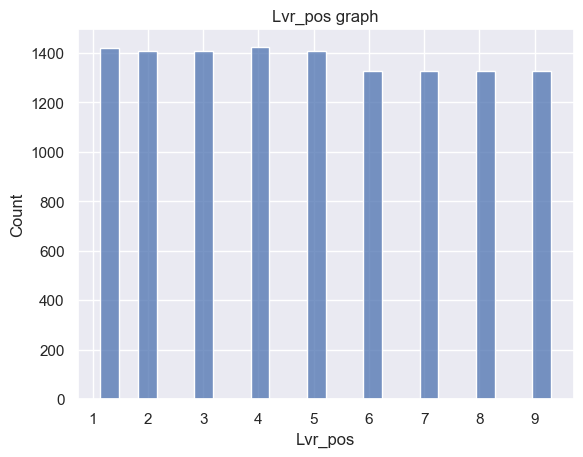

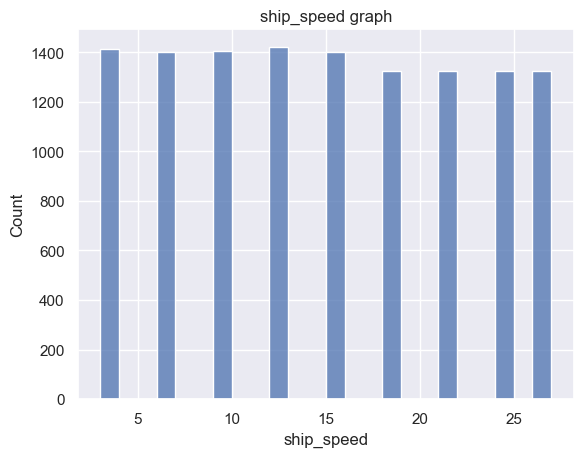

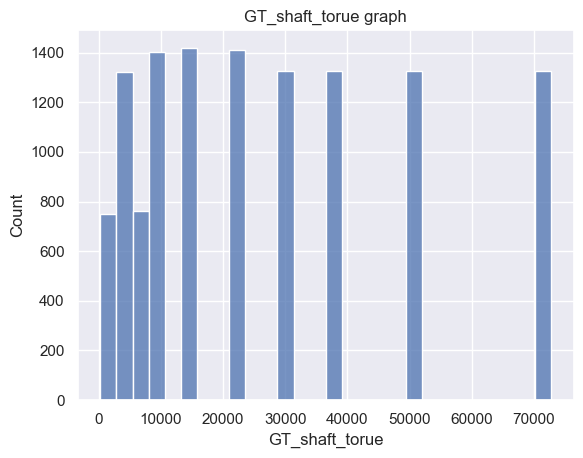

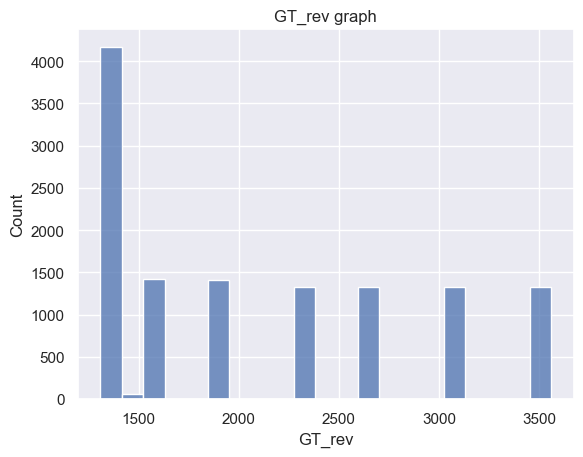

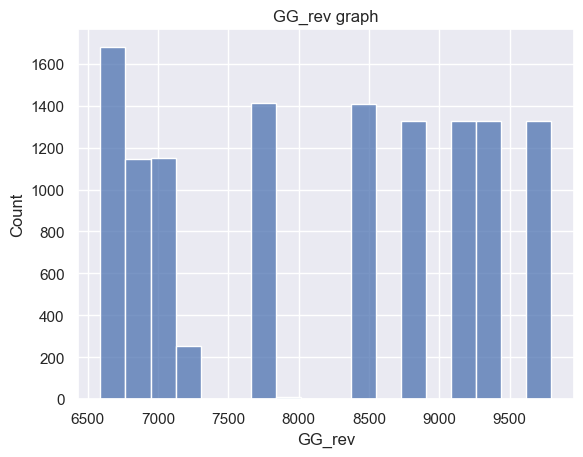

...

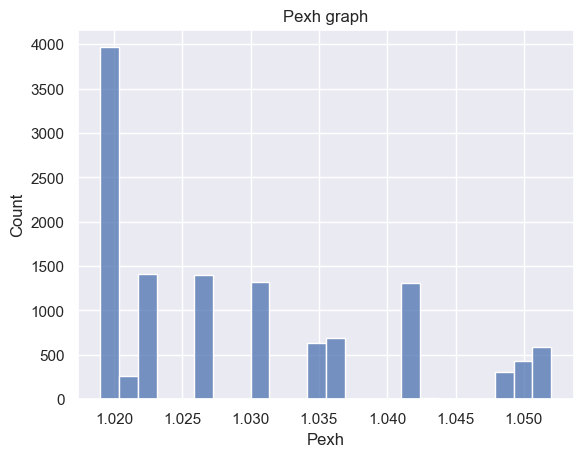

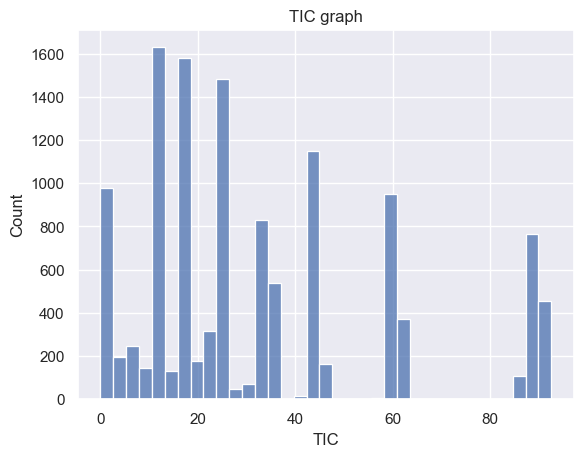

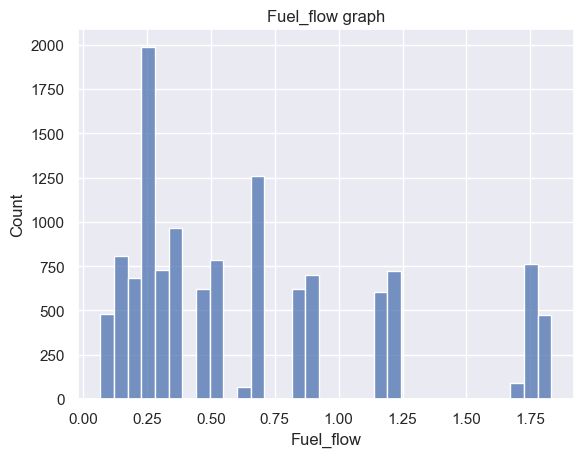

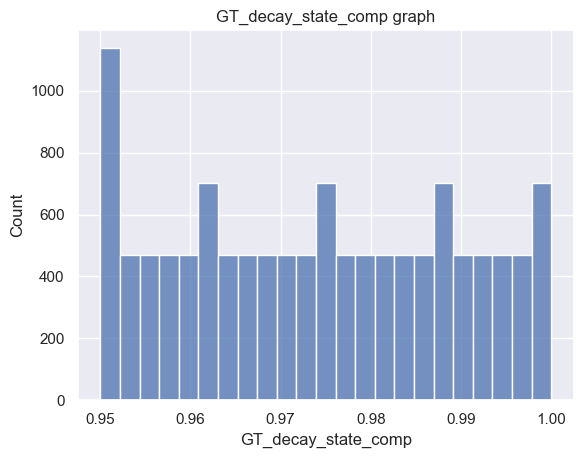

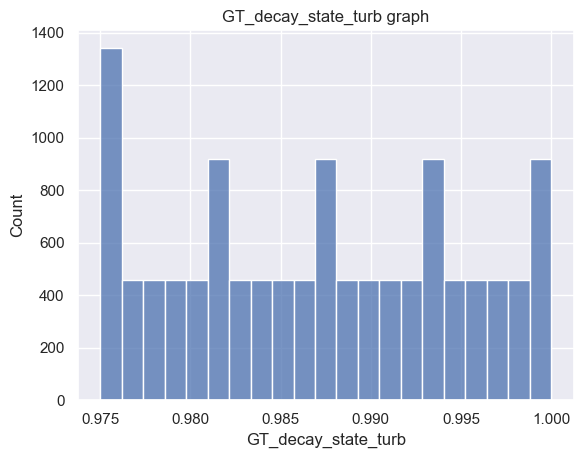

<Figure size 640x480 with 0 Axes>

In [11]:
for i in cbm_dataset.columns:
    sns.histplot(cbm_dataset[i])
    plt.title(f"{i} graph")
    plt.show()
plt.savefig("plot1_count.png")

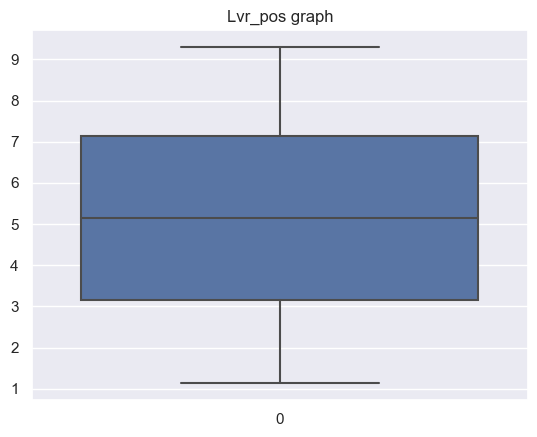

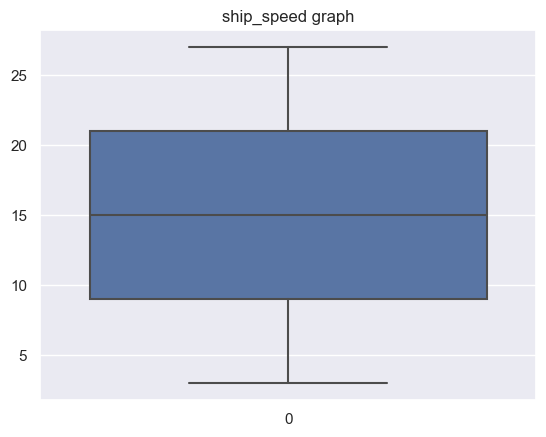

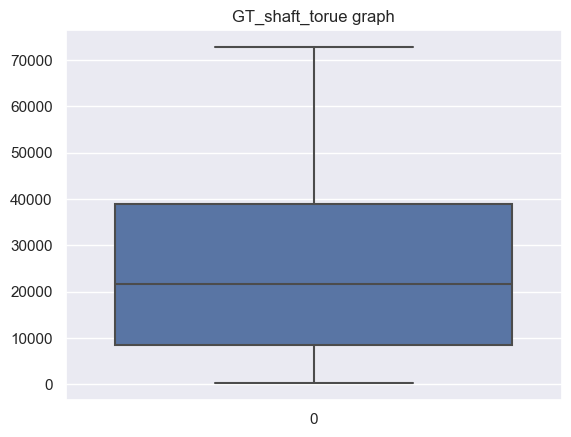

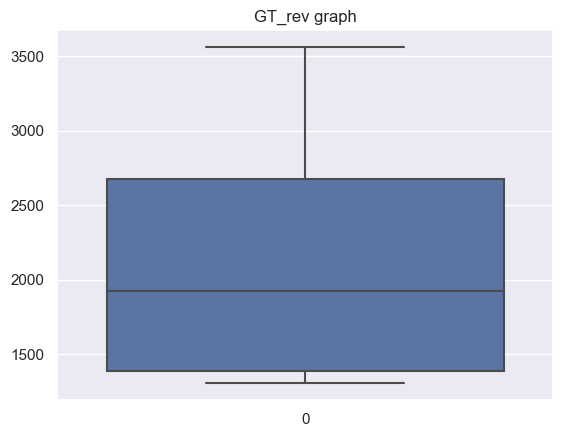

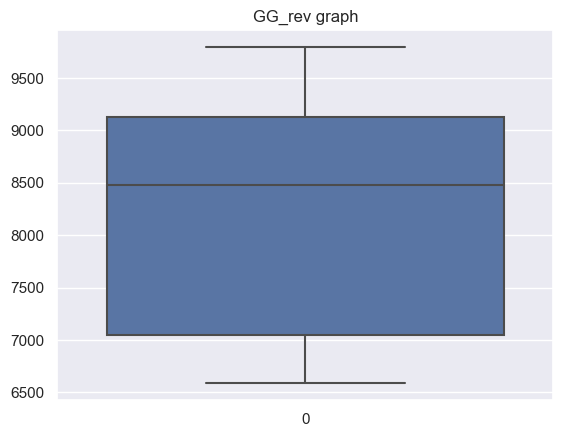

...

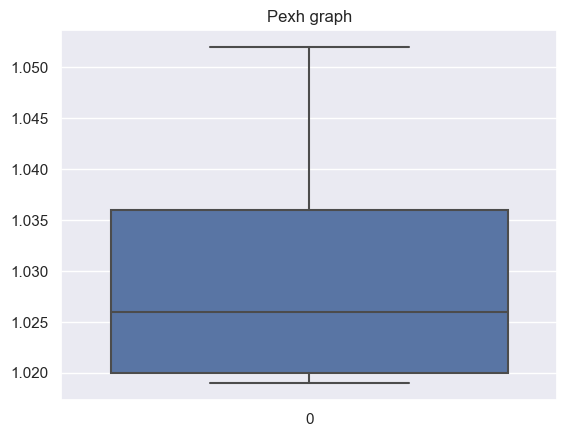

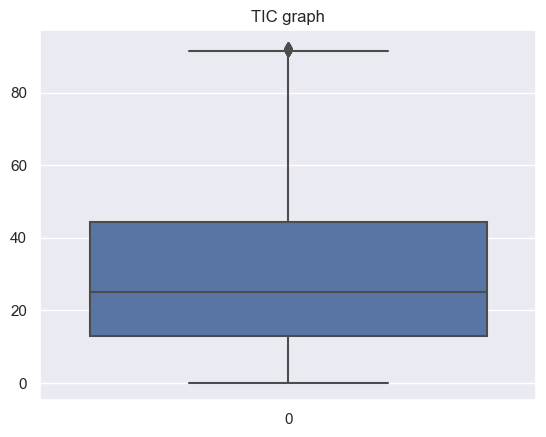

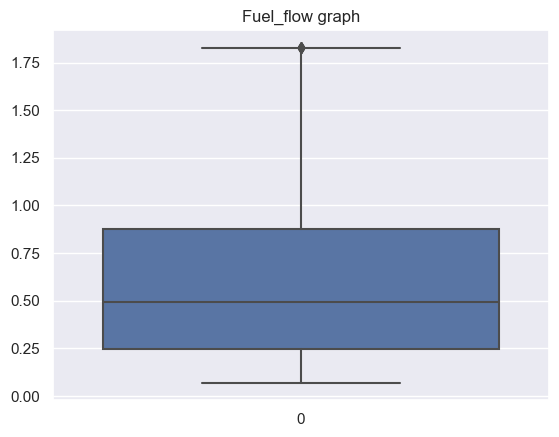

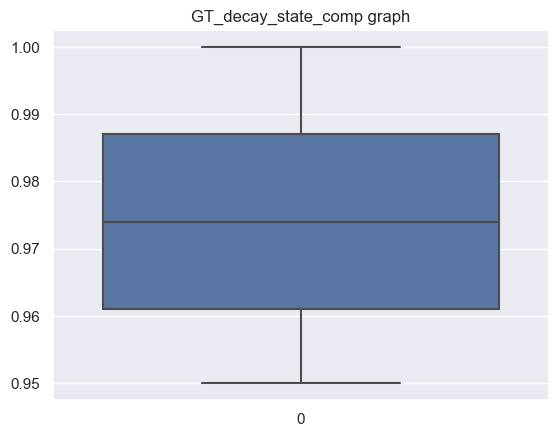

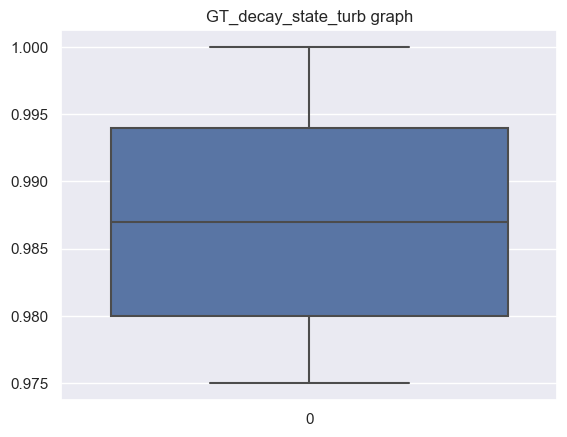

In [12]:
# if there are outliers so we can treat missing values accordingly
for i in cbm_dataset.columns:
    sns.boxplot(cbm_dataset[i])
    plt.title(f"{i} graph")
    plt.show()

In [13]:
# filling missing values with mean - measure of dispersion
for i in cbm_dataset.columns:
    cbm_dataset[i] = cbm_dataset[i].fillna(cbm_dataset[i].mean())

In [14]:
cbm_dataset.isnull().sum()

Lvr_pos                0
ship_speed             0
GT_shaft_torue         0
GT_rev                 0
GG_rev                 0
SP_prop                0
PP_tor                 0
HP_exit_temp           0
GT_inlet_temp          0
GT_outlet_temp         0
HP_exit_press          0
P1_inlet               0
P2_inlet               0
Pexh                   0
TIC                    0
Fuel_flow              0
GT_decay_state_comp    0
GT_decay_state_turb    0
dtype: int64

In [15]:
dataset_copy = cbm_dataset.copy()

## 2. Exploratory Data Analysis

#### 2.1 Statistcal Analysis

In [16]:
# Statistical Analysis
cbm_dataset.describe()

,Lvr_pos,ship_speed,GT_shaft_torue,GT_rev,GG_rev,SP_prop,PP_tor,HP_exit_temp,GT_inlet_temp,GT_outlet_temp,HP_exit_press,P1_inlet,P2_inlet,Pexh,TIC,Fuel_flow,GT_decay_state_comp,GT_decay_state_turb
count,12434.000000,12434.000000,12434.000000,12434.000000,12434.000000,12434.000000,12434.000000,12434.000000,12434.0,12434.000000,12434.000000,1.243400e+04,12434.000000,12434.000000,12434.000000,12434.000000,12434.000000,12434.000000
mean,5.095367,14.795968,26654.226582,2115.133769,8172.320577,222.066712,222.278151,731.467510,288.0,644.450808,2.323982,9.980000e-01,12.151153,1.029191,33.017819,0.649575,0.974117,0.987071
std,2.613718,7.705875,21962.653246,767.597933,1086.899905,198.688841,198.563079,172.299011,0.0,72.042323,1.075419,2.595798e-13,5.294963,0.010301,25.562628,0.502019,0.015138,0.007690
min,1.138000,3.000000,253.547000,1307.675000,6589.002000,5.304000,5.304000,442.364000,288.0,540.442000,1.093000,9.980000e-01,5.828000,1.019000,0.000000,0.068000,0.950000,0.975000
25%,3.144000,9.000000,8375.625500,1386.757000,7053.611500,60.315000,60.316000,590.409000,288.0,578.315000,1.389000,9.980000e-01,7.440000,1.020000,13.077750,0.247000,0.961000,0.980000
50%,5.140000,15.000000,21629.418500,1924.321000,8476.012000,175.259000,175.260000,704.288500,288.0,636.177500,2.081000,9.980000e-01,11.069500,1.026000,25.182500,0.494000,0.974000,0.987000
75%,7.148000,21.000000,38997.847750,2678.077000,9130.284000,332.326000,332.326000,830.386750,288.0,692.418750,2.978000,9.980000e-01,15.616000,1.036000,44.312000,0.877000,0.987000,0.994000
max,9.300000,27.000000,72784.872000,3560.741000,9797.103000,645.249000,645.249000,1115.797000,288.0,789.094000,4.560000,9.980000e-01,23.140000,1.052000,92.556000,1.832000,1.000000,1.000000


In [17]:
## let's see using z-score method

mean_sales = np.mean(cbm_dataset['GT_decay_state_turb'])
std_sales = np.std(cbm_dataset['GT_decay_state_turb'])

threshold = 3
outlier_z_list = []
for i in cbm_dataset['GT_decay_state_turb']:
    z_score = (i - mean_sales)/std_sales
    if z_score > threshold:
        outlier_z_list.append(i)
        
print(f"Total number of outliers {len(outlier_z_list)}.")
print(f"The Percentage of outliers is {(len(outlier_z_list)/len(cbm_dataset['GT_decay_state_turb']))*100} ")       
print(len([i for i in outlier_z_list if i>10.2]))

Total number of outliers 0.
The Percentage of outliers is 0.0 
0


#### 2.2 Univariate Analysis

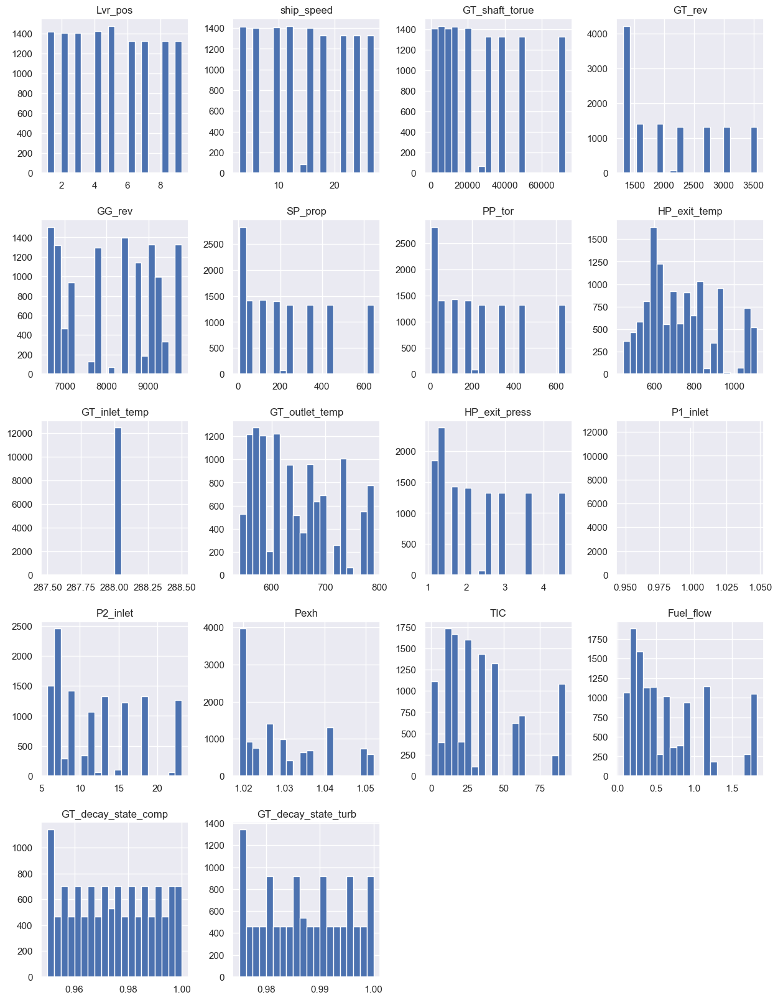

In [18]:
#Univariate Analysis
cbm_dataset.hist(bins = 20, figsize =(15,20))
plt.savefig("plot2_count.png")
plt.show()

#### 2.3 Bivariate analysis

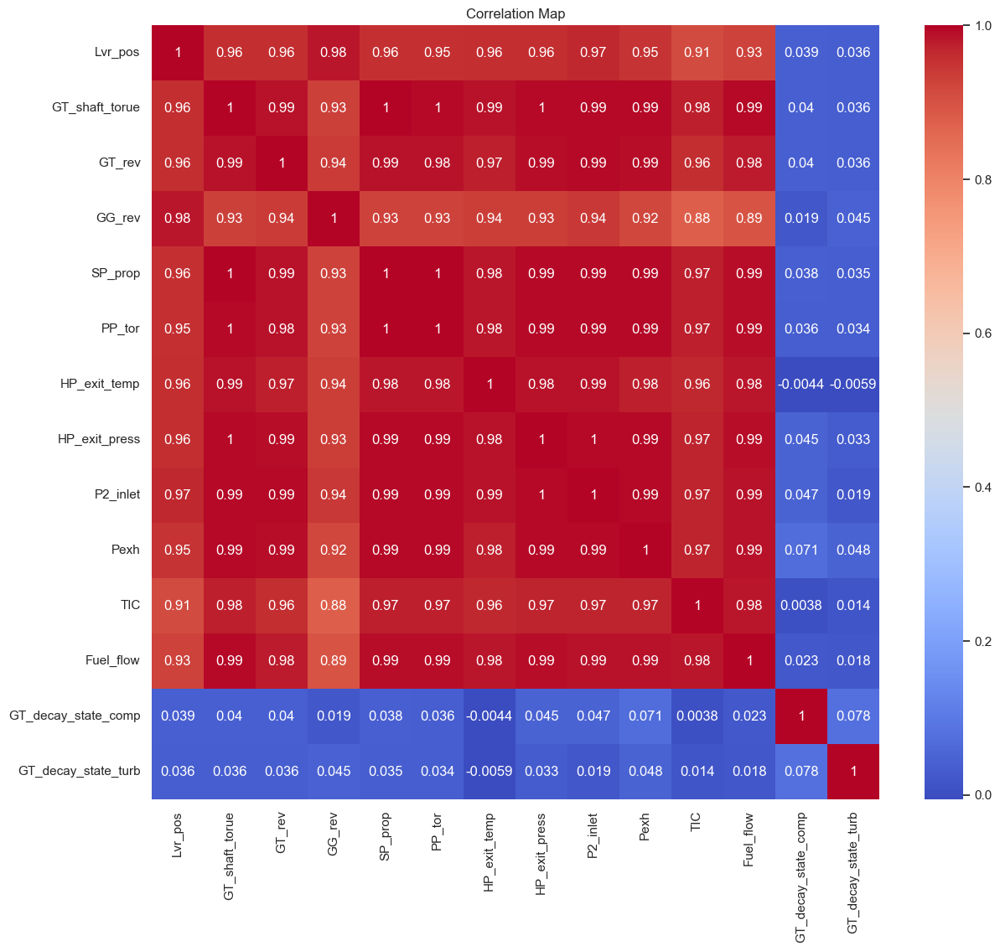

In [70]:
#Correlation

plt.figure(figsize = (14,12))
sns.heatmap(cbm_dataset.corr(), annot = True, cmap = 'coolwarm')
plt.title("Correlation Map")
plt.savefig('heatmap1.png', format = 'png', dpi = 100)
plt.show()

<AxesSubplot: ylabel='Density'>

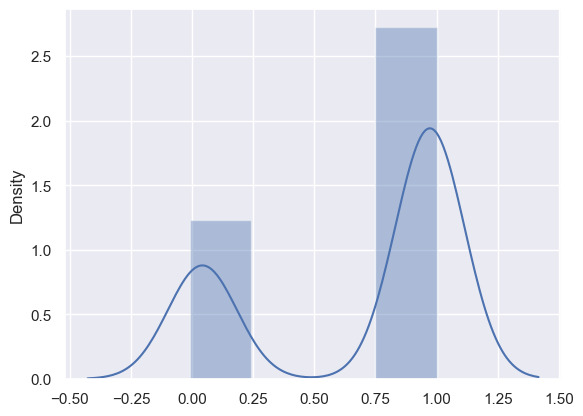

In [20]:
corr_map = cbm_dataset.corr()
sns.distplot(corr_map)

#### 2.4 Understanding Target Variable

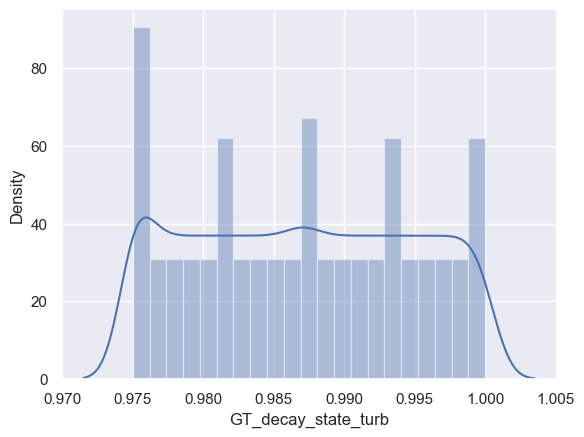

In [21]:
sns.distplot(cbm_dataset['GT_decay_state_turb'])
plt.savefig("TargetVar.png")

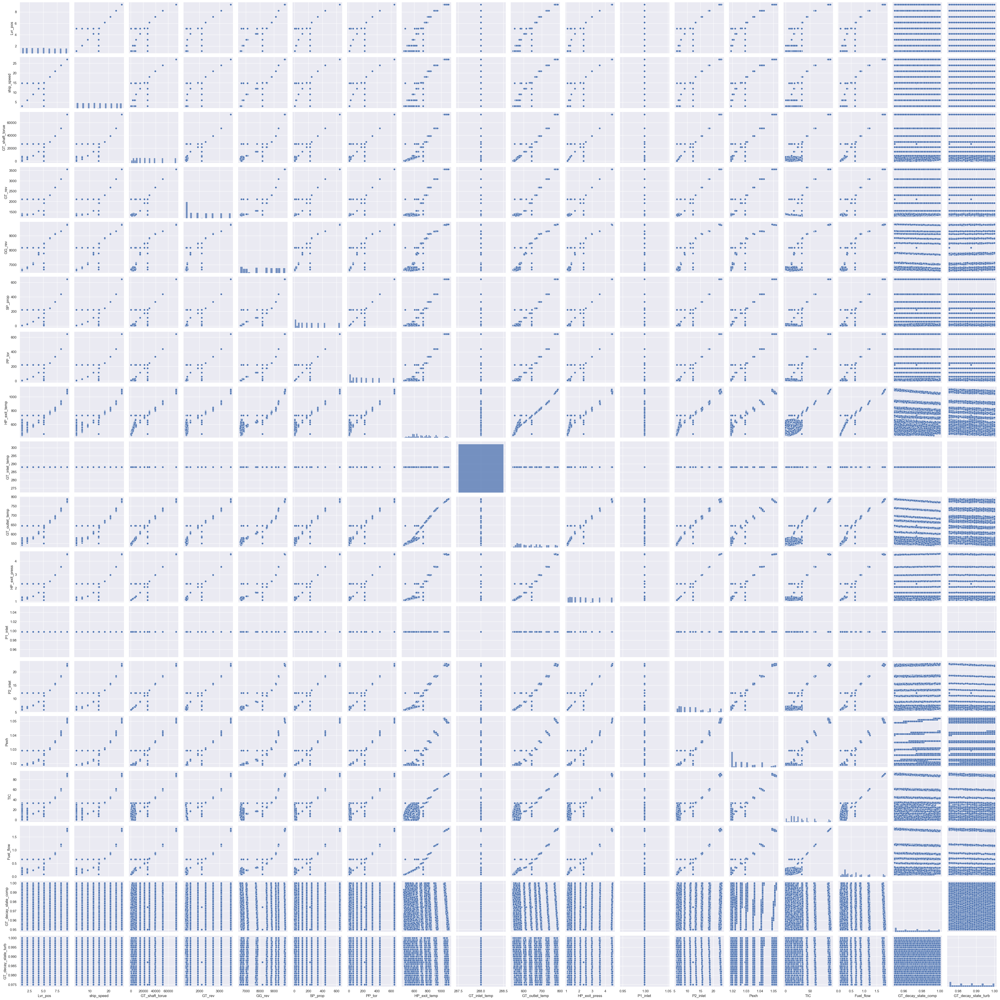

In [22]:
#lets see scatterplot for more analysis
sns.pairplot(cbm_dataset)
plt.savefig("pairplot.png")

#### 2.5 3D Analysis

In [23]:
def d3_scatterplot(col1, col2, col3):
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(cbm_dataset[col1], cbm_dataset[col2], cbm_dataset[col3])
    ax.set_xlabel(f"{col1}")
    ax.set_ylabel(f"{col2}")
    ax.set_zlabel(f"{col3}")
    plt.title('3D Scatter plot')
    plt.show()

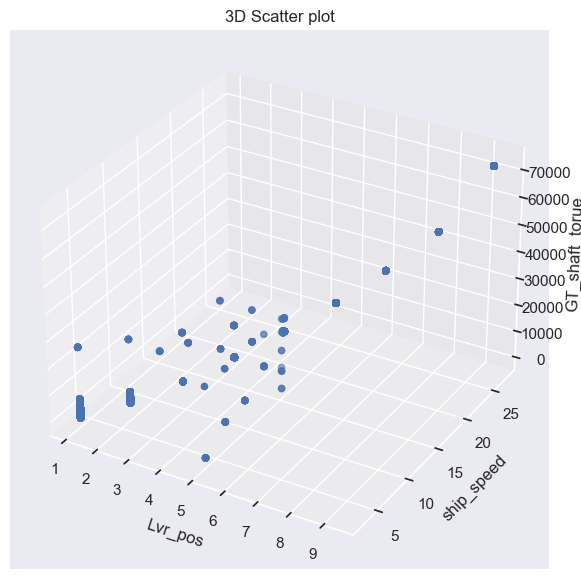

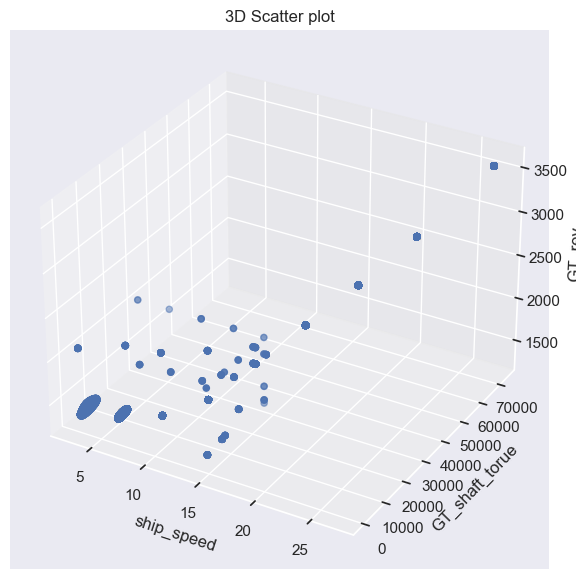

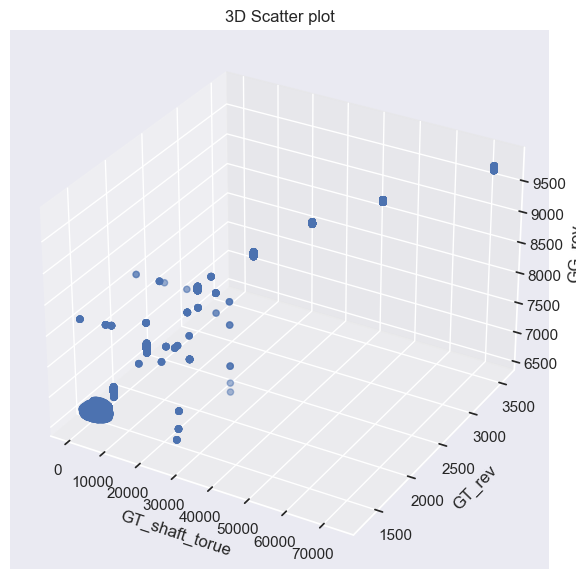

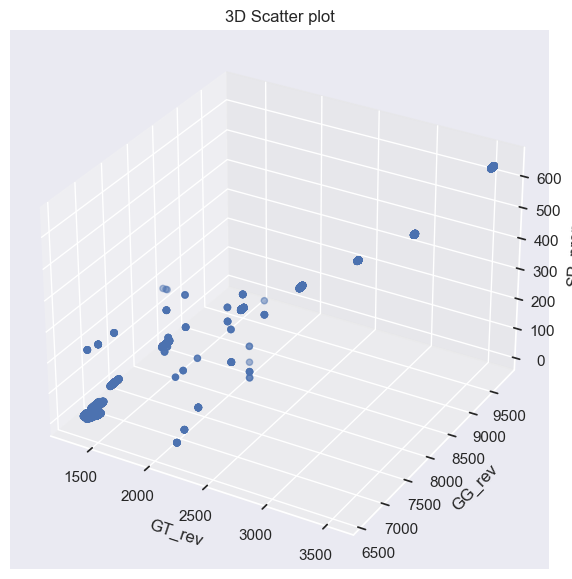

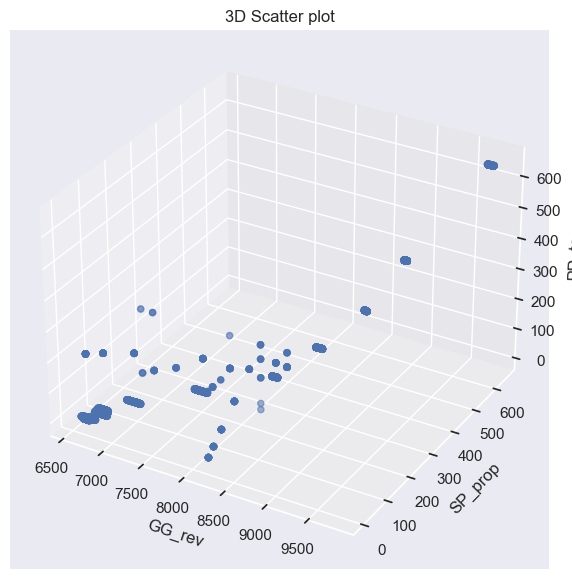

...

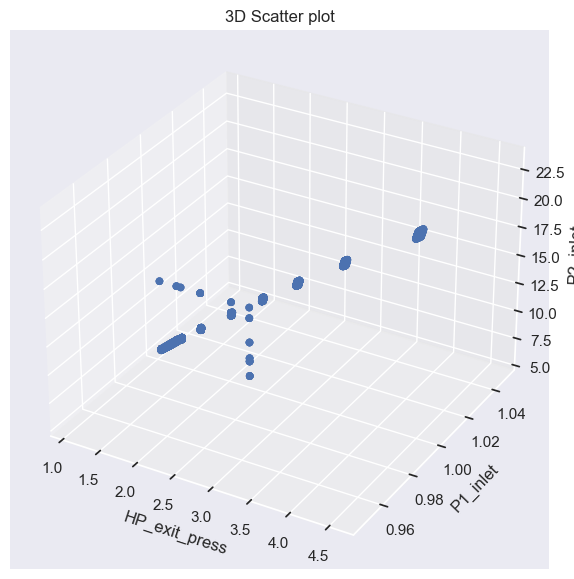

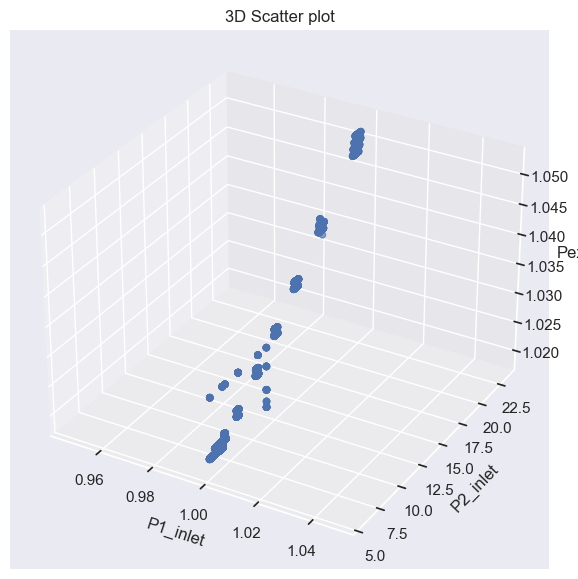

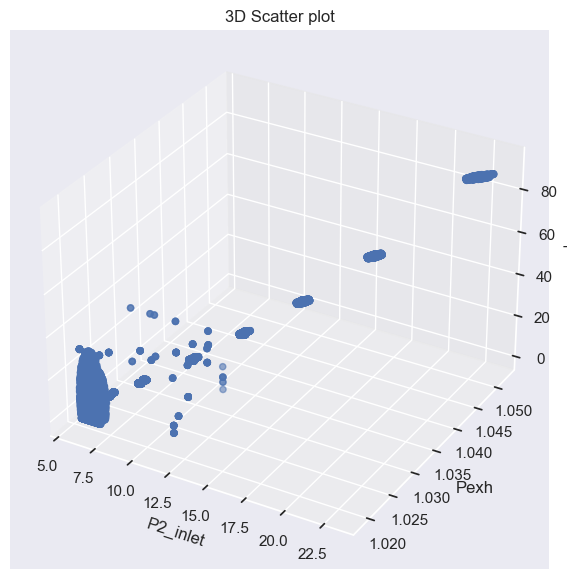

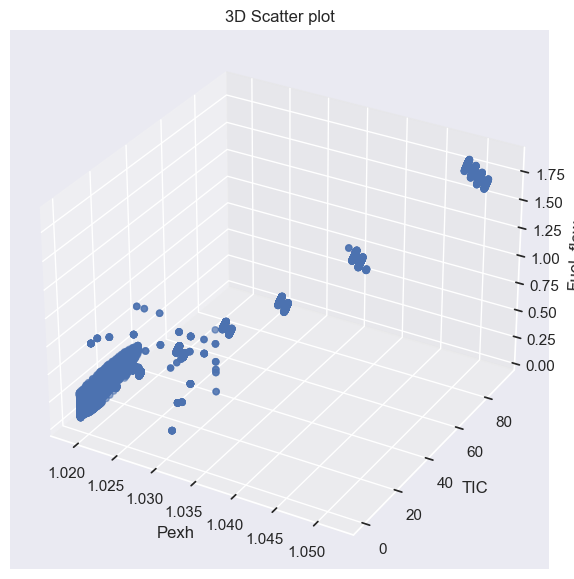

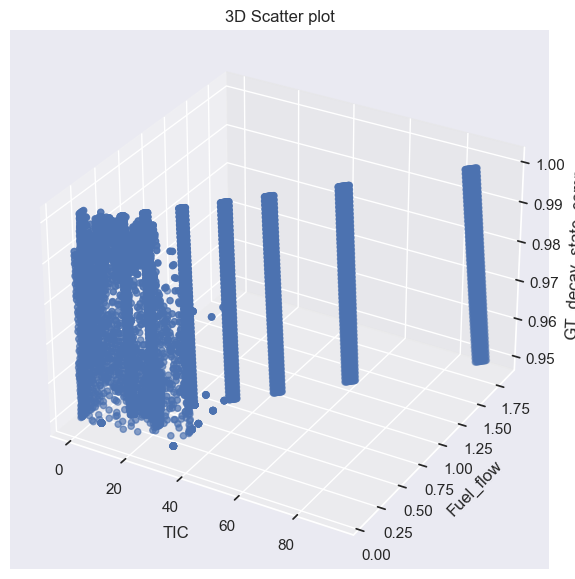

In [24]:
# Iterate over nums of columns
num_columns = cbm_dataset.shape[1]
for i in range(num_columns - 3):
    col1 = cbm_dataset.columns[i]
    col2 = cbm_dataset.columns[i + 1]
    col3 = cbm_dataset.columns[i + 2]
    d3_scatterplot(col1, col2, col3)

### Observations 

 - Based on the provided statistical analysis of the dataset, here are five key findings:

1. **Lever Position (Lvr_pos):
   - **Mean and Standard Deviation**: The average lever position is 5.10 with a standard deviation of 2.61, indicating a moderate level of variability around the mean.
   - **Range**: The lever position ranges from 1.14 to 9.30, suggesting a relatively broad range of control settings.

2. **Gas Turbine Shaft Torque (GT_shaft_torue):
   - **Mean and Standard Deviation**: The mean value of the gas turbine shaft torque is 26,654.23, with a high standard deviation of 21,962.65, indicating substantial variability in the torque values.
   - **Distribution**: The data is positively skewed, with a minimum value of 253.55 and a maximum value of 72,784.87, reflecting a wide range of torque measurements.

3. **Gas Generator Revolutions (GG_rev):
   - **Mean and Standard Deviation**: The average gas generator revolutions are 8,172.32, with a standard deviation of 1,086.90, indicating moderate variability.
   - **Quartile Analysis**: The 25th, 50th, and 75th percentiles are 7,053.61, 8,476.01, and 9,130.28, respectively, showing that the majority of the data points are clustered around these central values.

4. **Thermal Efficiency (thermal_efficiency):
   - **Mean and Standard Deviation**: The mean thermal efficiency is 0.453 with a relatively high standard deviation of 0.457, indicating significant variability.
   - **Range**: The thermal efficiency ranges from 0.000 to 1.000, suggesting that some instances achieve full efficiency while others do not.

5. **Fuel Flow (Fuel_flow):
   - **Mean and Standard Deviation**: The average fuel flow is 0.65 with a standard deviation of 0.50, indicating moderate variability.
   - **Quartile Analysis**: The 25th, 50th, and 75th percentiles are 0.247, 0.494, and 0.877, respectively, showing a skewed distribution with a significant proportion of lower fuel flow values.

These findings provide insights into the variability and distribution of key parameters within the dataset, highlighting areas of interest for further exploration and potential optimization in the gas propulsion system.

- Based on heatmap key findings are as follows:
Based on the updated correlation heatmap, here are some key observations:

1. **Strong Positive Correlations**:
   - **Lever Position (Lvr_pos) and GT Shaft Torque (GT_shaft_torue)**: These two variables have a very high correlation (0.96), indicating that as the lever position increases, the gas turbine shaft torque also increases proportionally.
   - **TIC and GT Shaft Torque (GT_shaft_torue)**: TIC shows a very high correlation (0.98) with GT shaft torque, suggesting a strong relationship between these two parameters.
   - **GG Rev and SP Prop (GG_rev_SP_prop)**: The correlation between GG rev and SP prop is extremely high (0.99), indicating a very strong relationship.

2. **Negative Correlations**:
   - **Fuel Efficiency and Various Parameters**: Fuel efficiency shows significant negative correlations with several parameters:
     - GT Shaft Torque (-0.54)
     - Lever Position (-0.42)
     - HP Pressure Ratio (-0.54)
   - These negative correlations suggest that as these parameters increase, fuel efficiency tends to decrease.

3. **Moderate to Low Correlations**:
   - **GT Decay State Comp and Other Variables**: GT decay state comp has relatively low correlations with most other variables, the highest being with GT inlet temp (0.12), indicating that GT decay state comp is less influenced by other parameters in the dataset.
   - **GT Decay State Turb and Other Variables**: Similar to GT decay state comp, GT decay state turb also shows low correlations with other variables, the highest being GT temp diff (0.14).

4. **Insignificant Correlations**:
   - **P1 Inlet**: P1 inlet shows very low correlation values with all other parameters, indicating it does not have a strong linear relationship with other variables in the dataset.

5. **Clusters of Highly Correlated Variables**:
   - **Lever Position, GT Shaft Torque, and HP Pressure Ratio**: These three variables are highly correlated with each other, forming a cluster of interrelated parameters.
   - **GG Rev and SP Prop**: As previously mentioned, these two variables are extremely highly correlated, indicating they could potentially be combined or one could be removed to avoid redundancy.

These observations suggest that certain parameters are highly interrelated, and in cases of strong correlations, dimensionality reduction techniques or multicollinearity mitigation strategies may be necessary. Parameters with strong negative correlations with fuel efficiency should be carefully analyzed to improve overall system performance.

## 3. Feature Engineering

In [25]:
corr_matrix = cbm_dataset.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool_))
to_drop = [column for column in upper.columns if any(upper[column] > 0.98)]
cbm_dataset_reduced = cbm_dataset.drop(columns=to_drop)

#### 3.1 Definition and Formulas - method used to reduce multicollinearity
Here are the theoretical formulas for the variables you've created in the `cbm_dataset_reduced` DataFrame:

1. **GT_temp_diff**

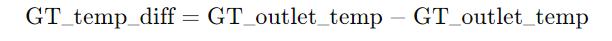

2. **HP_pressure_ratio**

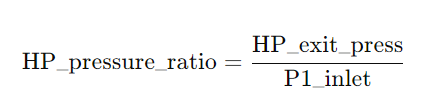

3. **fuel_efficiency**

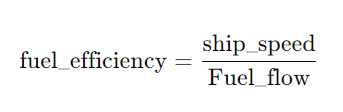

4. **power_torque_ratio**

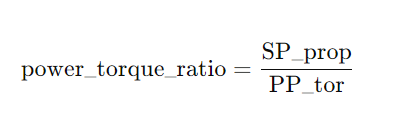

5. **thermal_efficiency**

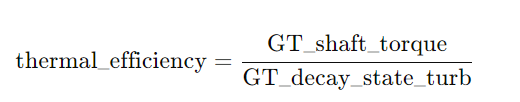

6. **GT_shaft_torque_GT_rev**

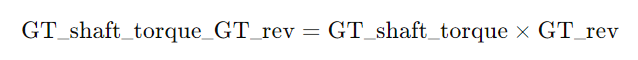

7. **GG_rev_SP_prop**

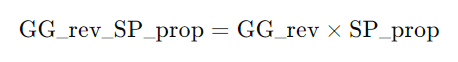

In [26]:
# we can drive some derived feature which will help us to build better model
# Fetaures we can get GT_temp_diff, HP_pressure_ratio, fuel_efficiency, power_torque_ratio, thermal_efficiency
cbm_dataset_reduced['GT_temp_diff'] = cbm_dataset['GT_outlet_temp'] - cbm_dataset['GT_outlet_temp']
cbm_dataset_reduced['HP_pressure_ratio'] = cbm_dataset['HP_exit_press'] / cbm_dataset['P1_inlet']
cbm_dataset_reduced['fuel_efficiency'] = cbm_dataset['ship_speed'] / cbm_dataset['Fuel_flow']
cbm_dataset_reduced['power_torque_ratio'] = cbm_dataset['SP_prop'] / cbm_dataset['PP_tor']
cbm_dataset_reduced['thermal_efficiency'] = cbm_dataset['GT_shaft_torue']/ cbm_dataset['GT_decay_state_turb']
cbm_dataset_reduced['GT_shaft_torque_GT_rev'] = cbm_dataset['GT_shaft_torue'] * cbm_dataset['GT_rev']
cbm_dataset_reduced['GG_rev_SP_prop'] = cbm_dataset['GG_rev'] * cbm_dataset['SP_prop']


In [27]:
cbm_dataset_reduced.columns

Index(['Lvr_pos', 'GT_shaft_torue', 'GT_inlet_temp', 'P1_inlet', 'TIC',
       'GT_decay_state_comp', 'GT_decay_state_turb', 'GT_temp_diff',
       'HP_pressure_ratio', 'fuel_efficiency', 'power_torque_ratio',
       'thermal_efficiency', 'GT_shaft_torque_GT_rev', 'GG_rev_SP_prop'],
      dtype='object')

In [28]:
cbm_dataset.drop(['ship_speed', 'GT_inlet_temp', 'P1_inlet', 'GT_outlet_temp'], axis=1, inplace=True)

In [29]:
cbm_dataset_reduced.head()

,Lvr_pos,GT_shaft_torue,GT_inlet_temp,P1_inlet,TIC,GT_decay_state_comp,GT_decay_state_turb,GT_temp_diff,HP_pressure_ratio,fuel_efficiency,power_torque_ratio,thermal_efficiency,GT_shaft_torque_GT_rev,GG_rev_SP_prop
0,5.140,21640.162,288.0,0.998,24.960,0.951,1.000,0.0,2.076152,30.364372,1.000000,21640.162000,4.164342e+07,1.493180e+06
1,9.300,72776.229,288.0,0.998,87.741,0.982,0.997,0.0,4.520040,15.544041,1.000000,72995.214644,2.591134e+08,6.296432e+06
2,8.206,50994.673,288.0,0.998,60.546,0.966,0.988,0.0,3.584168,20.016681,1.000000,51614.041498,1.574478e+08,4.080493e+06
3,5.140,21626.805,288.0,0.998,24.549,0.989,0.991,0.0,2.090180,30.864198,1.000000,21823.213925,4.161709e+07,1.484489e+06
4,5.140,21636.430,288.0,0.998,26.373,0.950,0.975,0.0,2.082164,28.735632,0.999049,22191.210256,4.163526e+07,1.886407e+06


In [30]:
cbm_dataset_reduced.shape

(12434, 14)

In [31]:
dataset_copy2 =  cbm_dataset_reduced.copy()

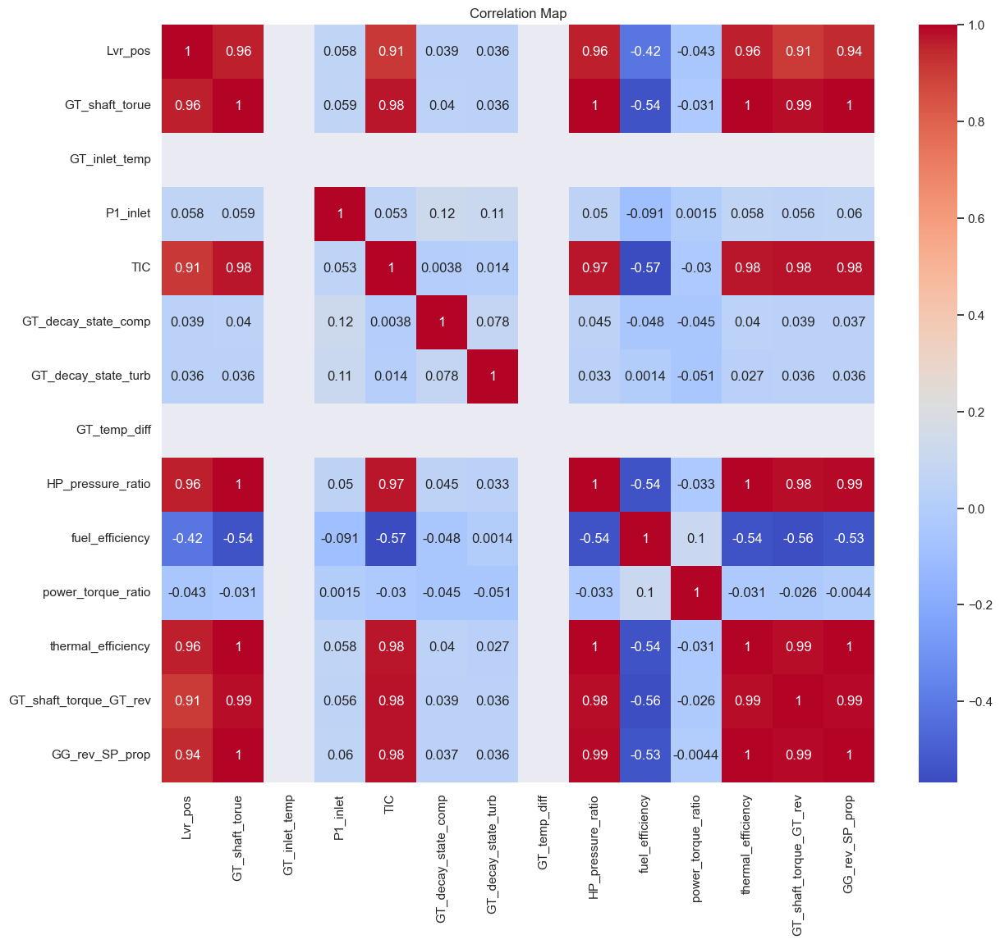

In [32]:
plt.figure(figsize = (14,12))
sns.heatmap(cbm_dataset_reduced.corr(), annot = True, cmap = 'coolwarm')
plt.title("Correlation Map")
plt.savefig('heatmap.png', format = 'png', dpi = 100)
plt.show()

In [33]:
cbm_dataset_reduced.head()

,Lvr_pos,GT_shaft_torue,GT_inlet_temp,P1_inlet,TIC,GT_decay_state_comp,GT_decay_state_turb,GT_temp_diff,HP_pressure_ratio,fuel_efficiency,power_torque_ratio,thermal_efficiency,GT_shaft_torque_GT_rev,GG_rev_SP_prop
0,5.140,21640.162,288.0,0.998,24.960,0.951,1.000,0.0,2.076152,30.364372,1.000000,21640.162000,4.164342e+07,1.493180e+06
1,9.300,72776.229,288.0,0.998,87.741,0.982,0.997,0.0,4.520040,15.544041,1.000000,72995.214644,2.591134e+08,6.296432e+06
2,8.206,50994.673,288.0,0.998,60.546,0.966,0.988,0.0,3.584168,20.016681,1.000000,51614.041498,1.574478e+08,4.080493e+06
3,5.140,21626.805,288.0,0.998,24.549,0.989,0.991,0.0,2.090180,30.864198,1.000000,21823.213925,4.161709e+07,1.484489e+06
4,5.140,21636.430,288.0,0.998,26.373,0.950,0.975,0.0,2.082164,28.735632,0.999049,22191.210256,4.163526e+07,1.886407e+06


In [34]:
## Creating test dataset
test_dataset = cbm_dataset_reduced.sample(n = 100, random_state = 42)
test_dataset.head()

,Lvr_pos,GT_shaft_torue,GT_inlet_temp,P1_inlet,TIC,GT_decay_state_comp,GT_decay_state_turb,GT_temp_diff,HP_pressure_ratio,fuel_efficiency,power_torque_ratio,thermal_efficiency,GT_shaft_torque_GT_rev,GG_rev_SP_prop
8626,4.161,14719.983,288.0,0.998,16.648,0.986,0.994,0.0,1.664329,36.363636,1.0,14808.836016,2.277854e+07,8.812991e+05
1006,6.175,29794.100,288.0,0.998,34.484,0.960,0.989,0.0,2.505010,26.354319,1.0,30125.480283,6.874467e+07,2.174693e+06
11999,2.088,2928.150,288.0,0.998,5.910,0.972,0.983,0.0,1.205411,45.801527,1.0,2978.789420,4.015750e+06,1.847128e+05
9199,4.161,14718.073,288.0,0.998,16.535,0.997,0.992,0.0,1.667335,36.697248,1.0,14836.767137,2.277547e+07,8.781048e+05
5863,2.088,6954.875,288.0,0.998,10.784,0.991,0.994,0.0,1.334669,22.813688,1.0,6996.856137,9.549182e+06,1.870179e+05


#### 3.2 Feature and Target Selection

In [35]:
# Feature selection GT_decay_state_turb
features = cbm_dataset_reduced.iloc[:,:]

target = cbm_dataset_reduced['GT_decay_state_turb']

In [36]:
features.drop('GT_decay_state_turb', axis =1, inplace = True)
features.head()

,Lvr_pos,GT_shaft_torue,GT_inlet_temp,P1_inlet,TIC,GT_decay_state_comp,GT_temp_diff,HP_pressure_ratio,fuel_efficiency,power_torque_ratio,thermal_efficiency,GT_shaft_torque_GT_rev,GG_rev_SP_prop
0,5.140,21640.162,288.0,0.998,24.960,0.951,0.0,2.076152,30.364372,1.000000,21640.162000,4.164342e+07,1.493180e+06
1,9.300,72776.229,288.0,0.998,87.741,0.982,0.0,4.520040,15.544041,1.000000,72995.214644,2.591134e+08,6.296432e+06
2,8.206,50994.673,288.0,0.998,60.546,0.966,0.0,3.584168,20.016681,1.000000,51614.041498,1.574478e+08,4.080493e+06
3,5.140,21626.805,288.0,0.998,24.549,0.989,0.0,2.090180,30.864198,1.000000,21823.213925,4.161709e+07,1.484489e+06
4,5.140,21636.430,288.0,0.998,26.373,0.950,0.0,2.082164,28.735632,0.999049,22191.210256,4.163526e+07,1.886407e+06


In [37]:
target.head()

0    1.000
1    0.997
2    0.988
3    0.991
4    0.975
Name: GT_decay_state_turb, dtype: float64

#### 3.3 Train - test - split

In [38]:
# Train_test_split
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 42)

In [39]:
from sklearn.preprocessing import StandardScaler

# Standardizing x_train and x_test
stdsc = StandardScaler()
x_train[x_train.columns] = stdsc.fit_transform(x_train[x_train.columns])
x_test[x_test.columns] = stdsc.transform(x_test[x_test.columns])

# Standardizing y_train and y_test
scaler = StandardScaler()

# If y_train and y_test are Series (single target variable), reshape them
if y_train.ndim == 1:
    y_train = y_train.values.reshape(-1, 1)
    y_test = y_test.values.reshape(-1, 1)

# Apply scaling
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)


## 4. Modelling

1. Decision Tree Regressor
2. Random Forest Regressor
3. XGBoost

In [40]:
# model building
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor()
dtree.fit(x_train, y_train)

DecisionTreeRegressor()

In [41]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

#Initializing empty list for evaluation metrics

mae_train_eval = []
mae_test_eval = []

mse_train_eval = []
mse_test_eval = []

r2_score_eval_train = []
r2_score_eval_test = []

rmse_train_eval = []
rmse_test_eval = []

#defining function to evaluate every model
def evaluation_metrics(model):
    y_pred_train = model.predict(x_train)
    y_pred_test = model.predict(x_test)
    
    #mean absolute error
    mae_train = mean_absolute_error(y_pred_train, y_train)
    mae_test = mean_absolute_error(y_pred_test, y_test)
    
    
    #mean sqaured error
    mse_train = mean_squared_error(y_pred_train, y_train)
    mse_test = mean_squared_error(y_pred_test, y_test)
    
    # root mean squared error
    rmse_train = mean_squared_error(y_pred_train, y_train, squared = False)
    rmse_test = mean_squared_error(y_pred_test, y_test, squared = False)
    
    #r2 score
    r2_score_train = r2_score(y_pred_train, y_train)
    r2_score_test = r2_score(y_pred_test, y_test)
     
    
    # Appending evaluation list
    mae_train_eval.append(mae_train)
    mae_test_eval.append(mae_test)
    
    mse_train_eval.append(mse_train)
    mse_test_eval.append(mse_train)
    
    rmse_train_eval.append(rmse_train)
    rmse_test_eval.append(rmse_test)
    
    r2_score_eval_train.append(r2_score_train)
    r2_score_eval_test.append(r2_score_test)
    
    #printing values
    print(f"Mean Absolute Error of train : {mae_train}")
    print(f"Mean Absolute Error of test : {mae_test}")
    print("****" * 9)

    print(f"Mean Squared Error of train : {mse_train}")
    print(f"Mean Squared Error of test : {mse_test}")
    print("****" * 9)
    
    print(f"Root mean Squared Error of train : {rmse_train}")
    print(f"Root mean Squared Error of test : {rmse_test}")
    print("****" * 9)

    print(f"R2 score of train : {r2_score_train}")
    print(f"R2 score of test : {r2_score_test}")
    print("****" * 9)


   

In [42]:
evaluation_metrics(dtree)

Mean Absolute Error of train : 1.8812960123196327e-16
Mean Absolute Error of test : 0.07330697707227705
************************************
Mean Squared Error of train : 1.298264190374774e-31
Mean Squared Error of test : 0.0735384525333594
************************************
Root mean Squared Error of train : 3.6031433365532016e-16
Root mean Squared Error of test : 0.271179742114634
************************************
R2 score of train : 1.0
R2 score of test : 0.9242058568733575
************************************


In [43]:
# feature importance
feature_imp = dtree.feature_importances_

In [44]:
pd.DataFrame(index = cbm_dataset_reduced.columns, data= feature_imp, columns = ['VIF'])

,VIF
Lvr_pos,0.000843
GT_shaft_torue,0.116963
GT_inlet_temp,0.000000
P1_inlet,0.000000
TIC,0.031956
GT_decay_state_comp,0.112261
GT_temp_diff,0.000000
HP_pressure_ratio,0.012002
fuel_efficiency,0.034023
power_torque_ratio,0.002551


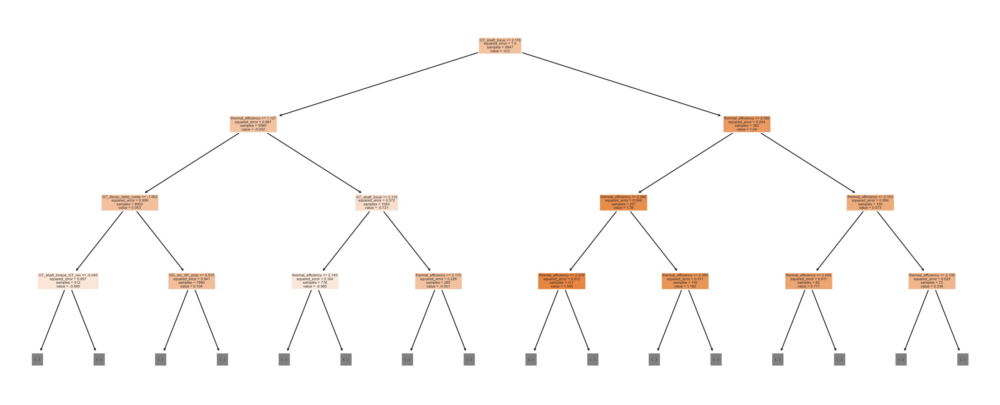

In [45]:
# let's see how tree looks - for max_depth = 3
from sklearn.tree import plot_tree
plt.figure(figsize=(20,8), dpi = 200)
plot_tree(dtree,filled=True,feature_names = cbm_dataset_reduced.columns, max_depth=3)
plt.show()

In [46]:
from sklearn.model_selection import cross_val_score
cv = cross_val_score(dtree, x_train, y_train)

print(cv)
print("****"*10)
print(cv.mean())
print("***"*10)
print(cv.max())

[0.91893727 0.90835754 0.93428351 0.92795855 0.92002192]
****************************************
0.9219117581916784
******************************
0.9342835066343922


In [47]:
## Random forest regressor
from sklearn.ensemble import RandomForestRegressor
rfr =  RandomForestRegressor()
rfr.fit(x_train, y_train)

RandomForestRegressor()

In [48]:
evaluation_metrics(rfr)

Mean Absolute Error of train : 0.022260667479767793
Mean Absolute Error of test : 0.05914800463549769
************************************
Mean Squared Error of train : 0.005392842016788936
Mean Squared Error of test : 0.037121539965517196
************************************
Root mean Squared Error of train : 0.07343597222607552
Root mean Squared Error of test : 0.1926695096934572
************************************
R2 score of train : 0.9944416519266772
R2 score of test : 0.9592535070983064
************************************


In [49]:
from xgboost import XGBRegressor
xgb_model = XGBRegressor()
xgb_model.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [50]:
evaluation_metrics(xgb_model)

Mean Absolute Error of train : 0.0556183378794675
Mean Absolute Error of test : 0.09545543534223633
************************************
Mean Squared Error of train : 0.007089720271766897
Mean Squared Error of test : 0.03951814882340697
************************************
Root mean Squared Error of train : 0.08420047667185084
Root mean Squared Error of test : 0.19879172222053657
************************************
R2 score of train : 0.9927303437163779
R2 score of test : 0.9571306244327603
************************************


## 5. Performance and Evaluation

In [51]:
list_model = ['Decision Tree', 'RandomForest Regressor', 'XGB' ]

'''list_accuracy_train = [mae_train_eval, mse_train_eval,r2_score_eval_train, rmse_train_eval]
list_accuracy_test = [mae_test_eval, mse_test_eval, r2_score_eval_test, rmse_test_eval]'''

# creating dataframe
df_train_accuracy_final_allmodel = pd.DataFrame({'Method Used':list_model, "Accuracy": r2_score_eval_train})
df_test_accuracy_final_allmodel = pd.DataFrame({'Method Used':list_model, "Accuracy": r2_score_eval_test})

In [52]:
figure = px.bar(df_train_accuracy_final_allmodel,x = 'Method Used', y = 'Accuracy', text = 'Accuracy', 
                labels = { 'Accuracy':'Accuracy'}, title = 'Training R2-Score')
figure.update_layout(xaxis_tickangle = -60)
figure.show()

In [53]:
import plotly.express as px
figure = px.bar(df_test_accuracy_final_allmodel,x = 'Method Used', y = 'Accuracy', text = 'Accuracy', 
                labels = { 'Accuracy':'Accuracy'}, title = 'Testing R2-Score')
figure.update_layout(xaxis_tickangle = -60)
figure.show()

### 5.1 Hyperparameter Tunning

In [54]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline



# Define models
class_model = {
    'dtree': DecisionTreeRegressor(),
    'rfr': RandomForestRegressor(),
    'xgb': XGBRegressor()
}

# Define hyperparameters
class_hyperparams = {
    'dtree': {
        'dtree__criterion': ['squared_error', 'absolute_error'],
        'dtree__splitter': ['best', 'random'],
        'dtree__max_depth': [None, 10, 20, 30],
        'dtree__min_samples_split': [2, 5, 10],
        'dtree__min_samples_leaf': [1, 2, 5],
        'dtree__max_features': [None, 'sqrt', 'log2']
    },
    'rfr': {
        'rfr__n_estimators': [ 100, 200, 300],
        'rfr__max_depth': [None, 10,12,14]
    },
    'xgb': {
        'xgb__n_estimators': [100, 300, 400],
        'xgb__max_depth': [None, 10,12,14],
        'xgb__learning_rate': [0.005, 0.007, 0.008]
    }
}

# Hyperparameter tuning
for cl_name, cls in class_model.items():
    # Define pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        (cl_name, cls)
    ])
    
    # Define hyperparameter grid
    class_hyperparam = class_hyperparams[cl_name]
    
    # Set up GridSearchCV
    grid_search_model = GridSearchCV(pipeline, class_hyperparam, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
    
    # Fit the GridSearchCV object to the data
    grid_search_model.fit(x_train, y_train)
    
    # Print best hyperparameters and metrics
    print("-------" * 9)
    print(f"Best parameters for {cl_name}: {grid_search_model.best_params_}")
    
    # Predictions
    y_pred_train = grid_search_model.predict(x_train)
    y_pred_test = grid_search_model.predict(x_test)
    
    # Evaluate performance
    mae_train = mean_absolute_error(y_train, y_pred_train)
    mae_test = mean_absolute_error(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)
    
    print(f"Mean Absolute Error on train set for {cl_name}: {mae_train}")
    print(f"Mean Absolute Error on test set for {cl_name}: {mae_test}")
    print(f"R² score on train set for {cl_name}: {r2_train}")
    print(f"R² score on test set for {cl_name}: {r2_test}")

---------------------------------------------------------------
Best parameters for dtree: {'dtree__criterion': 'squared_error', 'dtree__max_depth': None, 'dtree__max_features': None, 'dtree__min_samples_leaf': 2, 'dtree__min_samples_split': 5, 'dtree__splitter': 'best'}
Mean Absolute Error on train set for dtree: 0.023278892893666674
Mean Absolute Error on test set for dtree: 0.08042680980364758
R² score on train set for dtree: 0.9935389708770237
R² score on test set for dtree: 0.9211573095573835
---------------------------------------------------------------
Best parameters for rfr: {'rfr__max_depth': None, 'rfr__n_estimators': 300}
Mean Absolute Error on train set for rfr: 0.021645327299635496
Mean Absolute Error on test set for rfr: 0.05807579472844295
R² score on train set for rfr: 0.9949232360101776
R² score on test set for rfr: 0.9639279506320654
---------------------------------------------------------------
Best parameters for xgb: {'xgb__learning_rate': 0.008, 'xgb__max_depth

### 5.2 Observation

### 6. Model Testing

In [55]:
#testing dataset
test_dataset.head()

,Lvr_pos,GT_shaft_torue,GT_inlet_temp,P1_inlet,TIC,GT_decay_state_comp,GT_decay_state_turb,GT_temp_diff,HP_pressure_ratio,fuel_efficiency,power_torque_ratio,thermal_efficiency,GT_shaft_torque_GT_rev,GG_rev_SP_prop
8626,4.161,14719.983,288.0,0.998,16.648,0.986,0.994,0.0,1.664329,36.363636,1.0,14808.836016,2.277854e+07,8.812991e+05
1006,6.175,29794.100,288.0,0.998,34.484,0.960,0.989,0.0,2.505010,26.354319,1.0,30125.480283,6.874467e+07,2.174693e+06
11999,2.088,2928.150,288.0,0.998,5.910,0.972,0.983,0.0,1.205411,45.801527,1.0,2978.789420,4.015750e+06,1.847128e+05
9199,4.161,14718.073,288.0,0.998,16.535,0.997,0.992,0.0,1.667335,36.697248,1.0,14836.767137,2.277547e+07,8.781048e+05
5863,2.088,6954.875,288.0,0.998,10.784,0.991,0.994,0.0,1.334669,22.813688,1.0,6996.856137,9.549182e+06,1.870179e+05


In [56]:
test_dataset.shape

(100, 14)

In [57]:
y_test_dataset = test_dataset['GT_decay_state_turb']
x_test_dataset = test_dataset.iloc[:,:]
x_test_dataset = x_test_dataset.drop('GT_decay_state_turb', axis = 1)

In [58]:
test_dataset.head()

,Lvr_pos,GT_shaft_torue,GT_inlet_temp,P1_inlet,TIC,GT_decay_state_comp,GT_decay_state_turb,GT_temp_diff,HP_pressure_ratio,fuel_efficiency,power_torque_ratio,thermal_efficiency,GT_shaft_torque_GT_rev,GG_rev_SP_prop
8626,4.161,14719.983,288.0,0.998,16.648,0.986,0.994,0.0,1.664329,36.363636,1.0,14808.836016,2.277854e+07,8.812991e+05
1006,6.175,29794.100,288.0,0.998,34.484,0.960,0.989,0.0,2.505010,26.354319,1.0,30125.480283,6.874467e+07,2.174693e+06
11999,2.088,2928.150,288.0,0.998,5.910,0.972,0.983,0.0,1.205411,45.801527,1.0,2978.789420,4.015750e+06,1.847128e+05
9199,4.161,14718.073,288.0,0.998,16.535,0.997,0.992,0.0,1.667335,36.697248,1.0,14836.767137,2.277547e+07,8.781048e+05
5863,2.088,6954.875,288.0,0.998,10.784,0.991,0.994,0.0,1.334669,22.813688,1.0,6996.856137,9.549182e+06,1.870179e+05


In [59]:
y_test_dataset = test_dataset['GT_decay_state_turb'].reset_index(drop =True)
y_test_dataset.columns = ['GT_decay_state_turb']

In [60]:
y_test_dataset

0     0.994
1     0.989
2     0.983
3     0.992
4     0.994
      ...  
95    0.997
96    0.975
97    0.985
98    0.978
99    0.987
Name: GT_decay_state_turb, Length: 100, dtype: float64

In [61]:
# stadardizning data
from sklearn.preprocessing import MinMaxScaler
sc_x = MinMaxScaler()
sc_x_data = sc_x.fit_transform(x_test_dataset)
# Creating the DataFrame
sc_x_df = pd.DataFrame(sc_x_data, columns=x_test_dataset.columns)

In [62]:
sc_x_df.head()

,Lvr_pos,GT_shaft_torue,GT_inlet_temp,P1_inlet,TIC,GT_decay_state_comp,GT_temp_diff,HP_pressure_ratio,fuel_efficiency,power_torque_ratio,thermal_efficiency,GT_shaft_torque_GT_rev,GG_rev_SP_prop
0,0.370375,0.188695,0.0,0.0,0.183854,0.72,0.0,0.155248,0.707142,0.0,0.187098,0.082098,0.134495
1,0.617128,0.399345,0.0,0.0,0.380828,0.20,0.0,0.401941,0.396553,0.0,0.398167,0.260625,0.340820
2,0.116393,0.023913,0.0,0.0,0.065268,0.44,0.0,0.020582,1.000000,0.0,0.024075,0.009225,0.023374
3,0.370375,0.188668,0.0,0.0,0.182606,0.94,0.0,0.156131,0.717494,0.0,0.187483,0.082086,0.133985
4,0.116393,0.080183,0.0,0.0,0.119094,0.82,0.0,0.058512,0.286687,0.0,0.079446,0.030716,0.023742


In [63]:
rfr_new = RandomForestRegressor(n_estimators = 200)
rfr_new.fit(x_train, y_train)

RandomForestRegressor(n_estimators=200)

In [64]:
evaluation_metrics(rfr_new)

Mean Absolute Error of train : 0.021700423886054636
Mean Absolute Error of test : 0.058020942332434294
************************************
Mean Squared Error of train : 0.005048692500162146
Mean Squared Error of test : 0.03605937407517849
************************************
Root mean Squared Error of train : 0.0710541518854609
Root mean Squared Error of test : 0.18989305957611638
************************************
R2 score of train : 0.9947969306714868
R2 score of test : 0.9604214777591489
************************************


In [65]:
# predict the data
y_pred = rfr_new.predict(sc_x_data)
df_test = pd.DataFrame(y_pred, columns = ['GT_turb_decay_pred'])

In [66]:
df_test.head()

,GT_turb_decay_pred
0,0.859457
1,1.120263
2,0.682434
3,0.873730
4,0.716078


In [67]:
# Inverse
df_test[['GT_turb_decay_pred']] = scaler.inverse_transform(df_test[['GT_turb_decay_pred']])


In [68]:
final_result = pd.concat([y_test_dataset, df_test], axis=1).reset_index(drop = True )

# Setting the column names

final_result.head()

,GT_decay_state_turb,GT_turb_decay_pred
0,0.994,0.993710
1,0.989,0.995720
2,0.983,0.992346
3,0.992,0.993820
4,0.994,0.992605


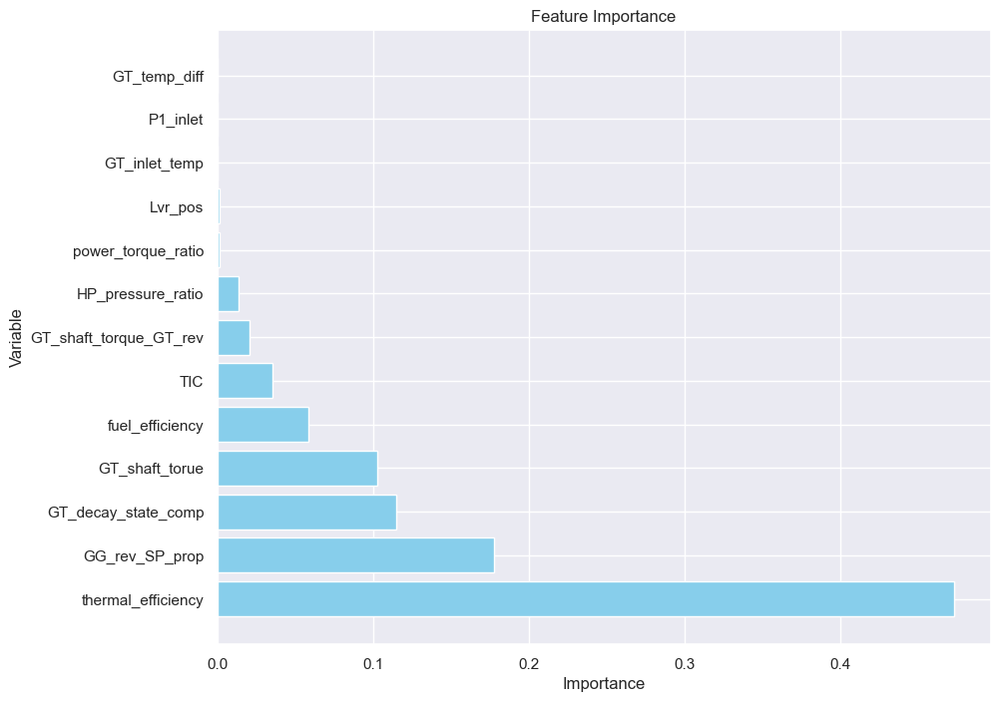

In [69]:
## Understanding and visualizing feature importance
feature_imp = pd.DataFrame({"Variable": sc_x_df.columns, "Importance": rfr_new.feature_importances_})
feature_imp.sort_values(by="Importance", ascending=False, inplace=True)
plt.figure(figsize=(10, 8))
plt.barh(feature_imp['Variable'], feature_imp['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Variable')
plt.title('Feature Importance')
plt.show()

## 7.Recommendation and Conclusion

- **Recommendations: - 
1. Regularly monitor this ratio to ensure it remains within optimal ranges. Deviations could indicate issues with the high-pressure components or operational inefficiencies.

2. Analyze this ratio to identify opportunities for improving fuel efficiency. Consider optimizing fuel flow rates or exploring engine tuning adjustments to enhance performance.

3. Monitor this ratio to ensure it meets performance benchmarks. If the ratio is outside expected ranges, investigate potential adjustments to propulsion systems or operational settings.

4. Analyze this metric to gain insights into the relationship between gas generator revolutions and specific power. Use this information to optimize operational parameters for improved performance.


- **Conclusions: -


1. The dataset provides several key performance metrics, including efficiency, power output, and ratios. Regular monitoring of these metrics can help identify trends, potential issues, and areas for improvement.
Maintenance and Optimization

2. Performance metrics like thermal efficiency and fuel efficiency highlight the need for ongoing maintenance and optimization. Regular assessments can help maintain optimal performance and prevent costly downtime.

3. The ratios and products calculated can inform operational adjustments to improve efficiency and performance. Use these insights to guide decision-making and operational strategies.